<h2>Principal Component Analysis(PCA)</h2>

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.datasets import make_blobs

In [50]:
data, target = make_blobs(
    n_samples=1000, 
    n_features=50,
    centers=20,
    cluster_std=3, 
    random_state=2
)

print(data)
print(data.shape)
print(np.unique(target))

[[  5.96716922  -4.18945768  -2.11448201 ...  -1.18407235  -6.80533109
    7.79879511]
 [  8.9254121   -7.81178838   9.28911533 ...  -9.43256367  -7.51749862
    0.87498893]
 [ -7.15840854  -7.47900721  -5.24145152 ...   1.3563237    1.27417692
    0.06862913]
 ...
 [ -1.65396928  10.39963897   5.98591899 ...  -1.11521858  -7.31713881
    9.57135356]
 [ -8.45063586  -2.41171678  -3.40339173 ...  -4.29174933   2.62643611
   -5.16504879]
 [-11.58243905  -2.87582987  -9.84199951 ...   5.62631997  -6.44658447
    1.81192357]]
(1000, 50)
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19]


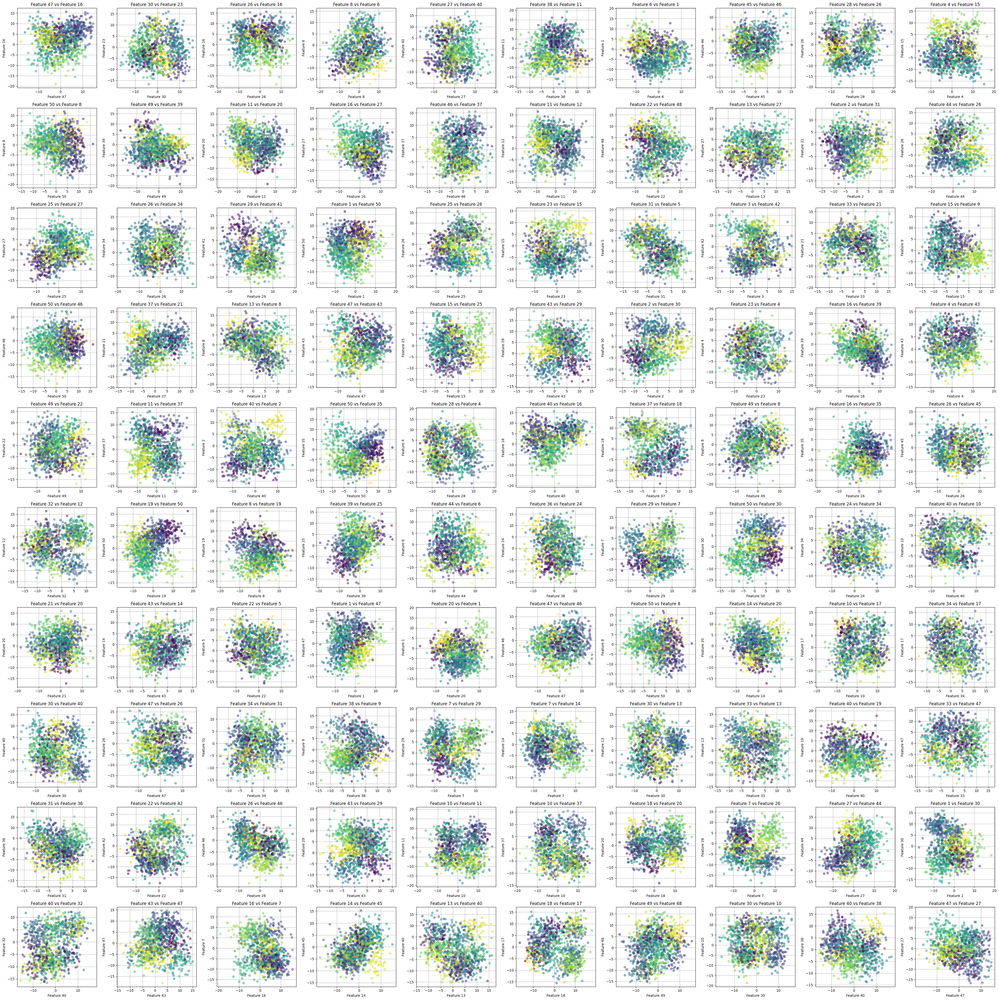

In [64]:
fig, axs = plt.subplots(10, 10, figsize=(40, 40))
axs = axs.flatten()
for ax in axs:
    feature_indices = np.random.choice(data.shape[1], size=2, replace=False)
    feature1, feature2 = feature_indices
    
    ax.scatter(data[:, feature1], data[:, feature2], c=target, cmap='viridis', alpha=0.5)
    ax.set_title(f'Feature {feature1+1} vs Feature {feature2+1}')
    ax.set_xlabel(f'Feature {feature1+1}')
    ax.set_ylabel(f'Feature {feature2+1}')
    ax.grid(True)

plt.tight_layout()
plt.show()

In [65]:
transform_data = PCA(n_components=3)
transform_data.fit(data)
transfered_data = transform_data.transform(data)
print(transfered_data.shape)
print(transfered_data)
print(sum(transform_data.explained_variance_ratio_))

(1000, 3)
[[-1.76091829e-02 -1.37106686e+01  5.31269804e+00]
 [-2.23147130e+01 -3.77905136e+00 -2.34817576e+01]
 [-1.98215248e+01  6.02316744e+00  9.18534674e+00]
 ...
 [ 1.03555845e+01  1.60980152e+01 -8.52406980e+00]
 [-2.11227056e+01  1.35641840e+01  1.15277397e+01]
 [ 7.61217882e+00 -2.75790294e+00  1.00224093e+01]]
0.2719146102395465


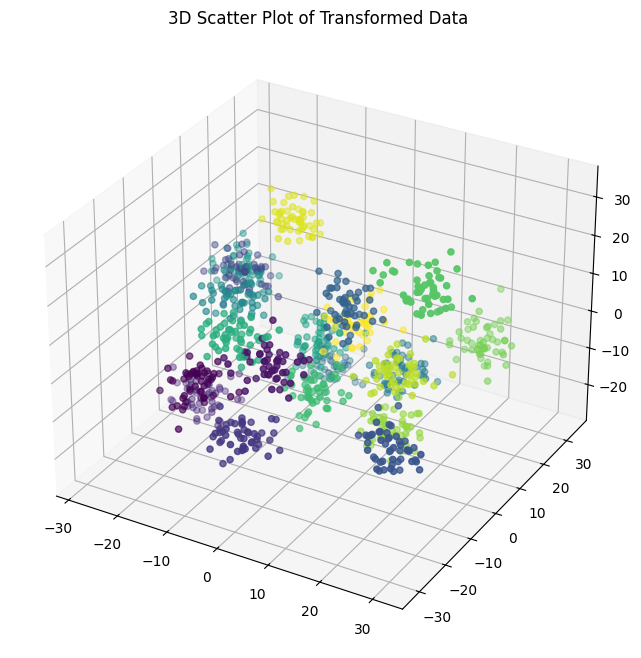

In [67]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(
    transfered_data[:, 0], 
    transfered_data[:, 1], 
    transfered_data[:, 2], 
    c=target, 
    cmap='viridis'
)

ax.set_title('3D Scatter Plot of Transformed Data')

plt.show()

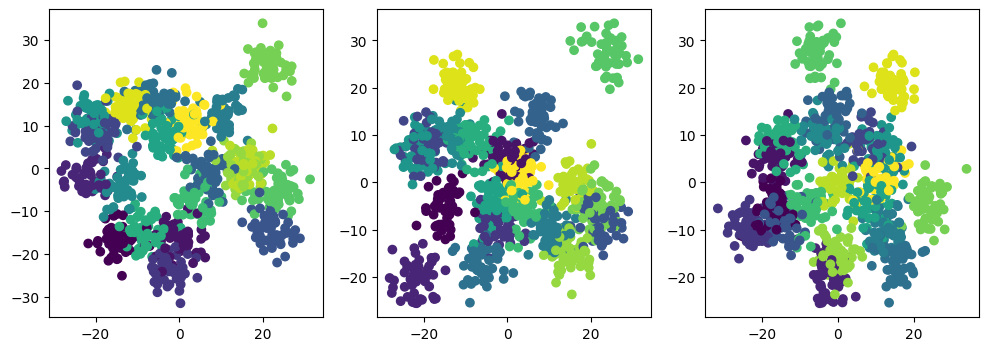

In [68]:
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.scatter(transfered_data[:,0], transfered_data[:,1], c=target)
plt.subplot(1, 3, 2)
plt.scatter(transfered_data[:,0], transfered_data[:,2], c=target)
plt.subplot(1, 3, 3)
plt.scatter(transfered_data[:,1], transfered_data[:,2], c=target)
plt.show()


In [69]:
transform_data = PCA(n_components=2)
transform_data.fit(data)
transfered_data = transform_data.transform(data)
print(transfered_data.shape)
print(transfered_data)
print(sum(transform_data.explained_variance_ratio_))

(1000, 2)
[[-1.74209520e-02 -1.37106495e+01]
 [-2.23149057e+01 -3.77964477e+00]
 [-1.98213960e+01  6.02302584e+00]
 ...
 [ 1.03555086e+01  1.60977370e+01]
 [-2.11226478e+01  1.35643301e+01]
 [ 7.61224965e+00 -2.75799855e+00]]
0.19290752281660742


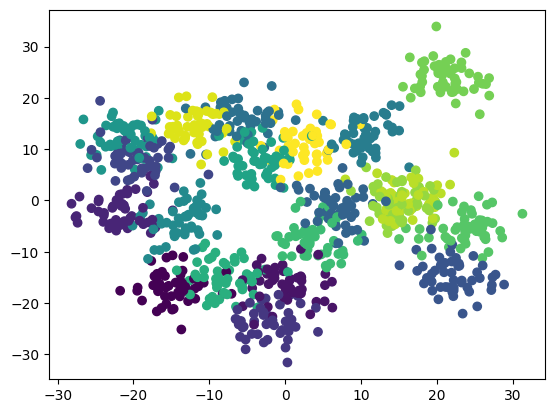

In [70]:
plt.scatter(transfered_data[:, 0], transfered_data[:, 1], c=target)
plt.show()

In [28]:
data1 = pd.read_csv("/home/sam/projects/machine-learning/data/toy_dataset.csv")
data1

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_990,feature_991,feature_992,feature_993,feature_994,feature_995,feature_996,feature_997,feature_998,feature_999
0,27.422157,-29.662712,-23.297163,-15.161935,0.345581,3.706750,-5.507209,-46.992476,5.175469,-47.768145,...,7.815960,24.320965,-33.987522,22.306088,31.173511,31.264830,8.380699,-25.843189,36.706408,-43.480792
1,3.489482,-19.153551,-14.636424,14.688258,20.114204,13.532852,34.298084,22.982509,37.938670,-35.648144,...,11.145527,-38.886603,44.579337,37.308519,29.560535,-10.643331,-6.499263,19.921666,-3.528982,31.068739
2,4.293509,22.691579,-1.045155,-8.740350,12.401082,31.362987,-18.831206,-35.384557,8.161430,-16.421762,...,48.190331,-0.503157,-21.740678,15.972237,1.122335,-45.473538,10.518065,-5.818320,-29.466301,-13.676685
3,-2.139348,23.158754,-26.241206,19.426465,9.472049,8.453948,0.637211,-26.675984,-43.823329,11.840874,...,-51.613076,13.278858,-44.179281,32.912282,4.805774,3.960836,-15.888356,61.384773,33.112334,5.088320
4,-35.251034,27.281816,-29.470282,-21.786865,11.806822,58.655133,5.375230,59.740676,-49.007717,-21.801155,...,0.010857,20.975655,-21.358371,18.709369,22.362477,41.214565,-7.217724,31.173870,37.097532,-27.509420
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,-19.331647,-0.366931,-45.003810,23.471513,28.763623,5.200654,-9.390098,24.495059,18.614589,-12.676268,...,-0.530597,-25.886767,15.909870,-12.305992,11.665251,-40.847296,-32.090600,32.656975,-30.864307,33.994823
496,-22.401837,33.158476,-7.511213,-14.897442,32.850515,31.573870,39.305110,15.333884,-11.832214,11.403074,...,-6.084563,-4.721127,-48.339012,21.661988,-1.722079,19.024689,-20.936766,31.727079,12.405595,-10.071446
497,34.675516,-25.555242,-9.359657,-40.558102,7.370166,42.936061,20.610569,-8.113407,15.245024,-19.350496,...,18.593883,25.024820,-20.524914,21.288515,26.961624,8.657218,47.231649,-6.338811,13.502616,-25.652088
498,28.873332,49.657090,-40.581331,-36.620498,-44.246918,5.831656,24.495664,-52.132250,22.615132,-9.985665,...,-33.513126,-15.557405,-9.446663,-1.540528,20.153705,-54.249946,-35.893373,55.850888,-19.910680,45.281842


In [31]:
def get_pairs(n = 100):
    from random import randint
    i = 0
    tuples = []
    while i < 100:
        x = data1.columns[randint(0,999)]
        y = data1.columns[randint(0,999)]
        while x == y or (x,y) in tuples or (y,x) in tuples:
            y = data1.columns[randint(0,999)]
        tuples.append((x,y))
        i+=1
    return tuples
            

In [33]:
pairs = get_pairs()

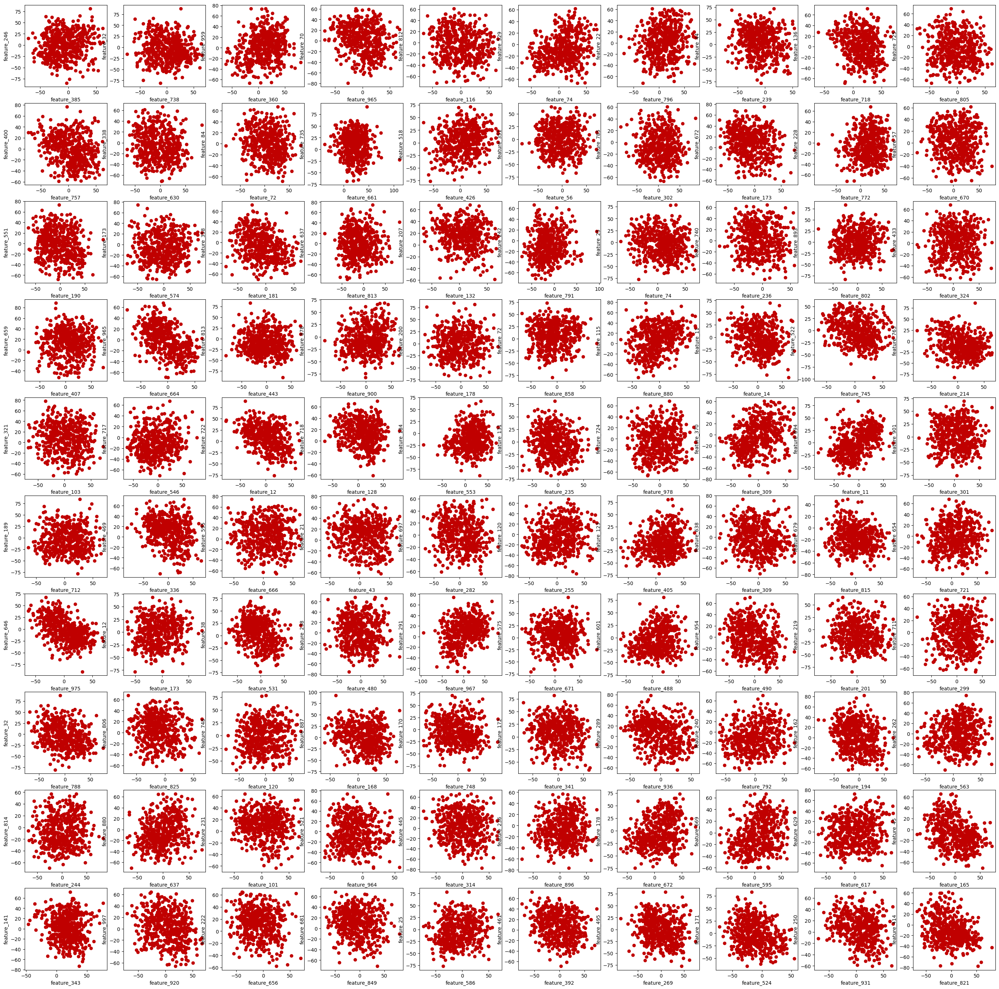

In [35]:
fig, axs = plt.subplots(10,10, figsize = (35,35))
i = 0
for rows in axs:
    for ax in rows:
        ax.scatter(data1[pairs[i][0]],data1[pairs[i][1]], color = "#C00000")
        ax.set_xlabel(pairs[i][0])
        ax.set_ylabel(pairs[i][1])
        i+=1


In [38]:
transfer_data1 = PCA(n_components=2)
transfer_data1.fit(data1)
transfered_data1 = transfer_data1.transform(data1)

In [39]:
print(sum(transfer_data1.explained_variance_ratio_))

0.14572843555106296


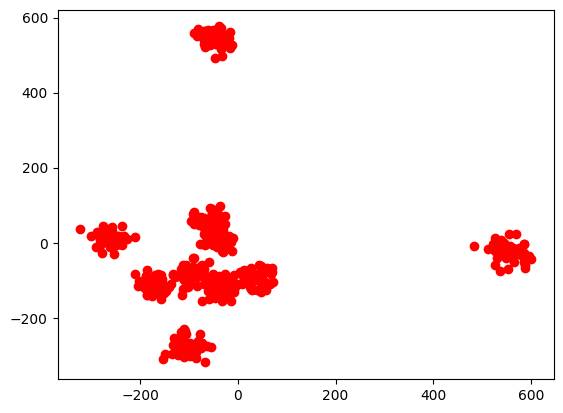

In [71]:
plt.scatter(transfered_data1[:, 0], transfered_data1[:, 1], color="red")
plt.show()

In [59]:
transfer_data1 = PCA(n_components=3)
transfer_data1.fit(data1)
transfered_data1 = transfer_data1.transform(data1)
print(sum(transfer_data1.explained_variance_ratio_))

0.20806257816093268


/tmp/ipykernel_12317/2416230171.py:3: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(


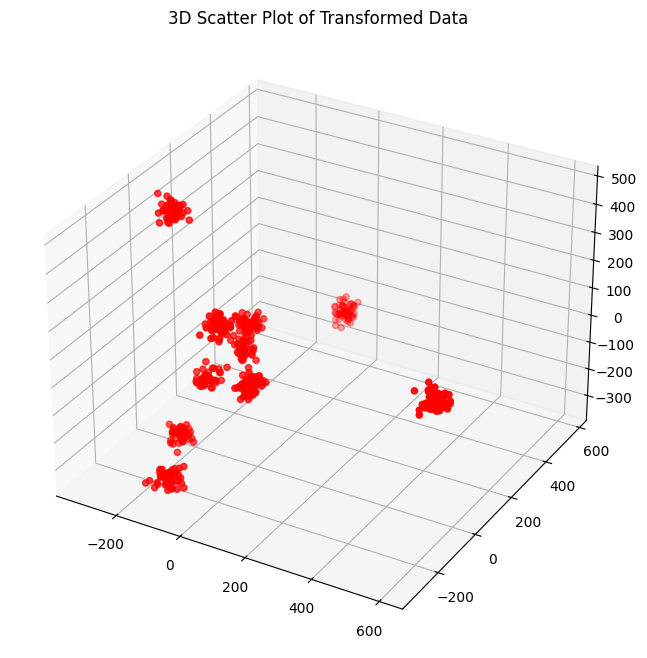

In [72]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(
    transfered_data1[:, 0], 
    transfered_data1[:, 1], 
    transfered_data1[:, 2], 
    cmap='viridis',
    color="red"
)

ax.set_title('3D Scatter Plot of Transformed Data')

plt.show()